In [ ]:
import os
import cv2
import shutil
import numpy as np
import pandas as pd
from glob import glob
import matplotlib.pyplot as plt
import xml.etree.ElementTree as xet
from sklearn.model_selection import train_test_split

In [ ]:
!pip install ultralytics


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 914.9/914.9 kB 29.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 80.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 56.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 52.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 13.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 85.7 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstall

Downloading Dataset From Kaggle

In [ ]:
import kagglehub
andrewmvd_car_plate_detection_path = kagglehub.dataset_download('andrewmvd/car-plate-detection')

print('Data source import complete.')

dataset_path = andrewmvd_car_plate_detection_path
import re

def the_number_in_the_string(filename):
    match = re.search(r'(\d+)', filename)
    return int(match.group(0)) if match else 0


labels_dict = dict(img_path=[], xmin=[], xmax=[], ymin=[], ymax=[], img_w=[], img_h=[])

xml_files = glob(f'{dataset_path}/annotations/*.xml')
for filename in sorted(xml_files, key=the_number_in_the_string):
    info = xet.parse(filename)
    root = info.getroot()
    member_object = root.find('object')
    labels_info = member_object.find('bndbox')
    xmin = int(labels_info.find('xmin').text)
    xmax = int(labels_info.find('xmax').text)
    ymin = int(labels_info.find('ymin').text)
    ymax = int(labels_info.find('ymax').text)

    img_name = xet.parse(filename).getroot().find('filename').text
    img_path = os.path.join(dataset_path, 'images',img_name)

    labels_dict['img_path'].append(img_path)
    labels_dict['xmin'].append(xmin)
    labels_dict['xmax'].append(xmax)
    labels_dict['ymin'].append(ymin)
    labels_dict['ymax'].append(ymax)

    height, width, _ = cv2.imread(img_path).shape
    labels_dict['img_w'].append(width)
    labels_dict['img_h'].append(height)

alldata = pd.DataFrame(labels_dict)
alldata

100%|██████████| 203M/203M [00:01<00:00, 126MB/s]

Extracting files...


Data source import complete.


,img_path,xmin,xmax,ymin,ymax,img_w,img_h
0,/root/.cache/kagglehub/datasets/andrewmvd/car-...,315,337,189,197,400,300
1,/root/.cache/kagglehub/datasets/andrewmvd/car-...,313,371,135,150,400,190
2,/root/.cache/kagglehub/datasets/andrewmvd/car-...,189,259,55,78,400,151
3,/root/.cache/kagglehub/datasets/andrewmvd/car-...,156,250,121,204,400,225
4,/root/.cache/kagglehub/datasets/andrewmvd/car-...,54,315,90,159,400,266
...,...,...,...,...,...,...,...
428,/root/.cache/kagglehub/datasets/andrewmvd/car-...,65,147,131,155,400,225
429,/root/.cache/kagglehub/datasets/andrewmvd/car-...,51,79,189,201,400,205
430,/root/.cache/kagglehub/datasets/andrewmvd/car-...,274,343,118,138,415,220
431,/root/.cache/kagglehub/datasets/andrewmvd/car-...,61,115,140,167,400,242


In [ ]:
train, test = train_test_split(alldata, test_size=1/10, random_state=42)
train, val = train_test_split(train, train_size=8/9, random_state=42)

print(f'''
      {len(train) = }
      {len(val) = }
      {len(test) = }
''')


      len(train) = 345
      len(val) = 44
      len(test) = 44



In [ ]:
if os.path.exists('datasets'):
    shutil.rmtree('datasets')

def make_split_folder_in_yolo_format(split_name, split_df):
    labels_path = os.path.join('datasets', 'cars_license_plate', split_name, 'labels')
    images_path = os.path.join('datasets', 'cars_license_plate', split_name, 'images')

    os.makedirs(labels_path)
    os.makedirs(images_path)

    for _, row in split_df.iterrows():
        img_name, img_extension = os.path.splitext(os.path.basename(row['img_path']))

        x_center = (row['xmin'] + row['xmax']) / 2 / row['img_w']
        y_center = (row['ymin'] + row['ymax']) / 2 / row['img_h']
        width = (row['xmax'] - row['xmin']) / row['img_w']
        height = (row['ymax'] - row['ymin']) / row['img_h']

        label_path = os.path.join(labels_path, f'{img_name}.txt')
        with open(label_path, 'w') as file:
            file.write(f"0 {x_center:.4f} {y_center:.4f} {width:.4f} {height:.4f}\n")

        shutil.copy(row['img_path'], os.path.join(images_path, img_name + img_extension))

    print(f"created '{images_path}' and '{labels_path}'")

make_split_folder_in_yolo_format("train", train)
make_split_folder_in_yolo_format("val", val)
make_split_folder_in_yolo_format("test", test)

created 'datasets/cars_license_plate/train/images' and 'datasets/cars_license_plate/train/labels'
created 'datasets/cars_license_plate/val/images' and 'datasets/cars_license_plate/val/labels'
created 'datasets/cars_license_plate/test/images' and 'datasets/cars_license_plate/test/labels'


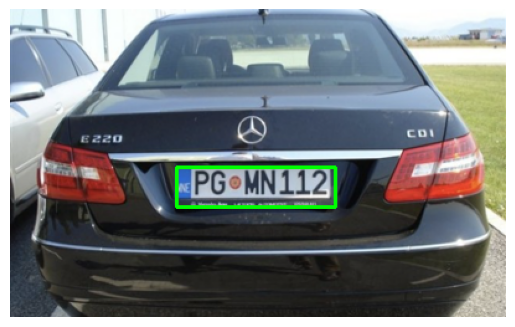

In [ ]:
'''
Plot the first train image and its bounding box.
'''
image_dir = 'datasets/cars_license_plate/train/images'
label_dir = 'datasets/cars_license_plate/train/labels'
image_files = sorted(os.listdir(image_dir))
first_image_file = image_files[0]
image_path = os.path.join(image_dir, first_image_file)
label_path = os.path.join(label_dir, os.path.splitext(first_image_file)[0] + '.txt')
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
with open(label_path, 'r') as f:
    lines = f.readlines()
for line in lines:
    class_id, x_center, y_center, width, height = map(float, line.strip().split())
    img_height, img_width, _ = image.shape
    x_center *= img_width
    y_center *= img_height
    width *= img_width
    height *= img_height
    x1 = int(x_center - width / 2)
    y1 = int(y_center - height / 2)
    x2 = int(x_center + width / 2)
    y2 = int(y_center + height / 2)
    cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)
plt.imshow(image)
plt.axis('off')
plt.show()

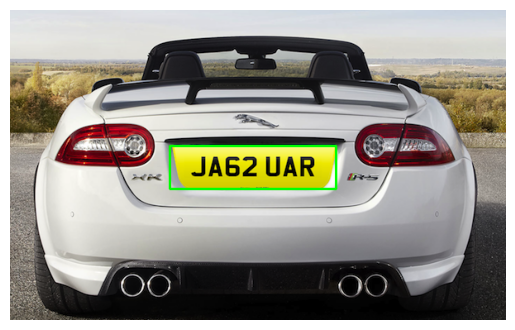

In [ ]:
'''
Plot the first train image and its bounding box.
'''
image_dir = 'datasets/cars_license_plate/train/images'
label_dir = 'datasets/cars_license_plate/train/labels'
image_files = sorted(os.listdir(image_dir))
first_image_file = image_files[20]
image_path = os.path.join(image_dir, first_image_file)
label_path = os.path.join(label_dir, os.path.splitext(first_image_file)[0] + '.txt')
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
with open(label_path, 'r') as f:
    lines = f.readlines()
for line in lines:
    class_id, x_center, y_center, width, height = map(float, line.strip().split())
    img_height, img_width, _ = image.shape
    x_center *= img_width
    y_center *= img_height
    width *= img_width
    height *= img_height
    x1 = int(x_center - width / 2)
    y1 = int(y_center - height / 2)
    x2 = int(x_center + width / 2)
    y2 = int(y_center + height / 2)
    cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)
plt.imshow(image)
plt.axis('off')
plt.show()

In [ ]:
datasets_yaml = '''
path: cars_license_plate

train: train/images
val: val/images
test: test/images

# number of classes
nc: 1

# class names
names: ['license_plate']
'''

with open('datasets.yaml', 'w') as file:
    file.write(datasets_yaml)
from ultralytics import YOLO

model = YOLO('yolov8s.pt')

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


100%|██████████| 21.5M/21.5M [00:00<00:00, 121MB/s] 


Training YOLO Algorithm

In [ ]:
model.train(
    data='datasets.yaml',
    epochs=88,
    batch=16,
    device='cuda',
    imgsz=320,
    cache=True,
)

Ultralytics 8.3.75 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=datasets.yaml, epochs=88, time=None, patience=100, batch=16, imgsz=320, save=True, save_period=-1, cache=True, device=cuda, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, line_wi

100%|██████████| 755k/755k [00:00<00:00, 23.3MB/s]


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 2]                 
  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  2                  -1  1     29056  ultralytics.nn.modules.block.C2f             [64, 64, 1, True]             
  3                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  4                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  5                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128, 256, 3, 2]              
  6                  -1  2    788480  ultralytics.nn.modules.block.C2f             [256, 256, 2, True]           
  7                  -1  1   1180672  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 111MB/s]


AMP: checks passed ✅


train: Scanning /content/datasets/cars_license_plate/train/labels... 345 images, 0 backgrounds, 0 corrupt: 100%|██████████| 345/345 [00:02<00:00, 145.53it/s]


train: New cache created: /content/datasets/cars_license_plate/train/labels.cache
WARNING ⚠️ cache='ram' may produce non-deterministic training results. Consider cache='disk' as a deterministic alternative if your disk space allows.


train: Caching images (0.1GB RAM): 100%|██████████| 345/345 [00:09<00:00, 36.24it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/datasets/cars_license_plate/val/labels... 44 images, 0 backgrounds, 0 corrupt: 100%|██████████| 44/44 [00:00<00:00, 137.18it/s]

val: New cache created: /content/datasets/cars_license_plate/val/labels.cache


WARNING ⚠️ cache='ram' may produce non-deterministic training results. Consider cache='disk' as a deterministic alternative if your disk space allows.


val: Caching images (0.0GB RAM): 100%|██████████| 44/44 [00:00<00:00, 59.24it/s]


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 320 train, 320 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 88 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/88      1.31G       1.79      3.646      1.334         24        320: 100%|██████████| 22/22 [00:04<00:00,  4.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.04it/s]

                   all         44         44      0.547      0.705      0.571      0.265



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/88      1.25G      1.481      1.178      1.141         15        320: 100%|██████████| 22/22 [00:02<00:00,  7.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.44it/s]

                   all         44         44      0.178      0.705      0.158     0.0691



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/88      1.26G      1.521      1.254      1.211         13        320: 100%|██████████| 22/22 [00:02<00:00,  7.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.78it/s]

                   all         44         44       0.58      0.659      0.586      0.294



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/88      1.23G      1.436      1.059      1.148         23        320: 100%|██████████| 22/22 [00:03<00:00,  5.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.62it/s]

                   all         44         44      0.641      0.727      0.713      0.348



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/88      1.26G      1.512      1.057      1.187         14        320: 100%|██████████| 22/22 [00:02<00:00,  8.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.08it/s]

                   all         44         44      0.351      0.364       0.24     0.0898



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/88      1.26G      1.448      1.012      1.187         20        320: 100%|██████████| 22/22 [00:02<00:00,  8.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.73it/s]

                   all         44         44     0.0594      0.364     0.0352     0.0166



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/88      1.23G      1.496      1.018       1.23         16        320: 100%|██████████| 22/22 [00:03<00:00,  5.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  8.95it/s]

                   all         44         44      0.268      0.205      0.168     0.0821



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/88      1.25G      1.403     0.9786      1.181         18        320: 100%|██████████| 22/22 [00:02<00:00,  7.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.76it/s]

                   all         44         44      0.111      0.523     0.0746     0.0323



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/88      1.24G      1.444     0.9504      1.171         15        320: 100%|██████████| 22/22 [00:02<00:00,  7.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.77it/s]

                   all         44         44     0.0979      0.205     0.0868      0.041



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/88      1.25G       1.38     0.9453      1.189         22        320: 100%|██████████| 22/22 [00:03<00:00,  6.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.03it/s]

                   all         44         44      0.645      0.841       0.75      0.353



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/88      1.24G       1.43     0.9501      1.164         21        320: 100%|██████████| 22/22 [00:02<00:00,  8.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.60it/s]

                   all         44         44       0.85      0.771      0.867      0.441



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/88      1.26G      1.378     0.8744      1.167         13        320: 100%|██████████| 22/22 [00:02<00:00,  7.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.72it/s]

                   all         44         44      0.744      0.818      0.773       0.41



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/88      1.23G      1.366     0.8515      1.143         20        320: 100%|██████████| 22/22 [00:03<00:00,  6.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.93it/s]

                   all         44         44      0.834      0.795      0.856      0.409



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/88      1.25G      1.372     0.8372      1.151         14        320: 100%|██████████| 22/22 [00:02<00:00,  7.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.88it/s]

                   all         44         44      0.773      0.818       0.84      0.431



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/88      1.23G       1.28     0.7931      1.141         14        320: 100%|██████████| 22/22 [00:02<00:00,  7.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.93it/s]

                   all         44         44      0.845      0.841      0.884       0.47



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/88      1.26G      1.288     0.8223      1.144         15        320: 100%|██████████| 22/22 [00:03<00:00,  7.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.58it/s]

                   all         44         44      0.813      0.788      0.814      0.438



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/88      1.23G      1.283     0.7926      1.128         13        320: 100%|██████████| 22/22 [00:02<00:00,  8.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 10.26it/s]


                   all         44         44      0.897      0.841      0.884      0.478

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/88      1.21G      1.294     0.7881       1.12         22        320: 100%|██████████| 22/22 [00:02<00:00,  8.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 10.32it/s]

                   all         44         44      0.875      0.818      0.864      0.454



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/88      1.23G      1.304     0.7871       1.14         19        320: 100%|██████████| 22/22 [00:03<00:00,  5.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.18it/s]

                   all         44         44      0.857      0.814       0.85      0.418



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/88      1.26G      1.244     0.7845      1.071         16        320: 100%|██████████| 22/22 [00:02<00:00,  7.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 10.01it/s]

                   all         44         44      0.804      0.842      0.859      0.482



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/88      1.23G      1.286     0.7775      1.108         19        320: 100%|██████████| 22/22 [00:02<00:00,  8.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 10.08it/s]

                   all         44         44      0.817      0.841       0.85      0.429



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/88      1.21G      1.166     0.7243      1.065         15        320: 100%|██████████| 22/22 [00:03<00:00,  7.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.45it/s]

                   all         44         44       0.73      0.841      0.816      0.419



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/88      1.23G      1.232     0.7464      1.124         15        320: 100%|██████████| 22/22 [00:02<00:00,  7.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 10.06it/s]

                   all         44         44      0.883      0.818      0.894      0.443



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/88      1.26G      1.173     0.7348      1.076         24        320: 100%|██████████| 22/22 [00:02<00:00,  7.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 10.00it/s]

                   all         44         44      0.814      0.818      0.787      0.417



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/88      1.23G      1.219     0.7174       1.09         21        320: 100%|██████████| 22/22 [00:02<00:00,  7.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.09it/s]

                   all         44         44      0.905      0.863      0.857      0.451



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/88      1.25G      1.171     0.7021      1.069         14        320: 100%|██████████| 22/22 [00:03<00:00,  6.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.26it/s]

                   all         44         44      0.796      0.886      0.887      0.453



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/88      1.23G      1.139     0.6835      1.045         13        320: 100%|██████████| 22/22 [00:02<00:00,  8.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.63it/s]

                   all         44         44       0.89      0.818      0.897      0.477



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/88      1.26G      1.177     0.6895      1.073         17        320: 100%|██████████| 22/22 [00:02<00:00,  7.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.91it/s]

                   all         44         44      0.795      0.882      0.863      0.476



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/88      1.24G      1.162     0.7064      1.049         20        320: 100%|██████████| 22/22 [00:03<00:00,  6.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.47it/s]

                   all         44         44      0.793      0.871      0.835      0.462



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/88      1.25G      1.132     0.6814      1.046         13        320: 100%|██████████| 22/22 [00:02<00:00,  7.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.40it/s]

                   all         44         44      0.842      0.864      0.873      0.478



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/88      1.24G      1.099     0.6834      1.036         13        320: 100%|██████████| 22/22 [00:02<00:00,  7.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.93it/s]

                   all         44         44      0.804      0.773      0.851      0.498



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/88      1.26G      1.025     0.6365      1.012         15        320: 100%|██████████| 22/22 [00:03<00:00,  5.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 10.10it/s]

                   all         44         44      0.845      0.795      0.844      0.496



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/88      1.24G      1.092     0.6208      1.042         10        320: 100%|██████████| 22/22 [00:02<00:00,  7.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.73it/s]

                   all         44         44      0.897      0.793      0.861      0.479



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/88      1.26G       1.06     0.6176      1.039         25        320: 100%|██████████| 22/22 [00:02<00:00,  7.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.60it/s]

                   all         44         44      0.898      0.804      0.849      0.454



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/88      1.23G      1.097     0.6464       1.03         22        320: 100%|██████████| 22/22 [00:03<00:00,  5.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  8.92it/s]

                   all         44         44      0.894      0.773      0.864      0.487



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/88      1.26G      1.058     0.6226      1.022         16        320: 100%|██████████| 22/22 [00:02<00:00,  7.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  8.99it/s]

                   all         44         44      0.825      0.909      0.848      0.475



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/88      1.23G       1.03     0.6078      1.018         15        320: 100%|██████████| 22/22 [00:02<00:00,  7.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 10.01it/s]

                   all         44         44      0.855      0.841       0.89      0.442



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/88      1.21G     0.9824     0.5998      1.003         19        320: 100%|██████████| 22/22 [00:03<00:00,  6.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.33it/s]

                   all         44         44      0.862      0.864       0.88      0.487



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/88      1.26G      1.008     0.6148      1.005         16        320: 100%|██████████| 22/22 [00:02<00:00,  7.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.87it/s]

                   all         44         44      0.879      0.841      0.881      0.514



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/88      1.25G      1.019     0.5776      1.007         16        320: 100%|██████████| 22/22 [00:02<00:00,  7.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.72it/s]

                   all         44         44      0.843      0.795       0.86      0.469



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/88      1.23G      1.018     0.5957      1.026         12        320: 100%|██████████| 22/22 [00:03<00:00,  6.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.55it/s]

                   all         44         44      0.768      0.827      0.838       0.47



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/88      1.25G      1.023     0.5834      1.014         15        320: 100%|██████████| 22/22 [00:02<00:00,  7.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.69it/s]

                   all         44         44      0.772      0.845       0.82      0.458



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/88      1.23G      1.016     0.6163     0.9926         16        320: 100%|██████████| 22/22 [00:02<00:00,  7.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.12it/s]

                   all         44         44      0.832      0.864      0.863      0.483



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/88      1.25G      0.955     0.5895     0.9937         22        320: 100%|██████████| 22/22 [00:03<00:00,  6.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.92it/s]

                   all         44         44      0.836      0.841       0.83      0.496



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/88      1.24G     0.9604     0.5694          1         23        320: 100%|██████████| 22/22 [00:02<00:00,  8.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.17it/s]

                   all         44         44      0.825      0.841      0.844      0.469



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/88      1.26G      1.003     0.5811      1.014         23        320: 100%|██████████| 22/22 [00:02<00:00,  8.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.81it/s]

                   all         44         44      0.869      0.841      0.878      0.497



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/88      1.23G     0.9275     0.5552     0.9603         16        320: 100%|██████████| 22/22 [00:02<00:00,  8.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.76it/s]

                   all         44         44      0.836      0.818      0.833      0.473



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/88      1.26G     0.9572     0.5588      0.998         19        320: 100%|██████████| 22/22 [00:03<00:00,  6.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.25it/s]

                   all         44         44      0.796      0.885      0.827      0.457



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/88      1.23G     0.9195     0.5626     0.9757         12        320: 100%|██████████| 22/22 [00:02<00:00,  8.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.32it/s]

                   all         44         44      0.877      0.811      0.844        0.5



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/88      1.25G     0.8818     0.5216      0.977         19        320: 100%|██████████| 22/22 [00:02<00:00,  8.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.95it/s]

                   all         44         44      0.806      0.848      0.852      0.518



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      51/88      1.23G     0.8973     0.5403     0.9716         23        320: 100%|██████████| 22/22 [00:03<00:00,  6.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  8.85it/s]

                   all         44         44      0.813      0.818      0.858      0.515



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      52/88      1.25G     0.8746     0.5205     0.9509         20        320: 100%|██████████| 22/22 [00:02<00:00,  8.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 10.15it/s]


                   all         44         44      0.785      0.818      0.827      0.476

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      53/88      1.23G     0.9525     0.5776      0.987         12        320: 100%|██████████| 22/22 [00:02<00:00,  8.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.83it/s]

                   all         44         44      0.809      0.841      0.841      0.489



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      54/88      1.25G     0.8972     0.5143     0.9692         17        320: 100%|██████████| 22/22 [00:03<00:00,  5.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.50it/s]

                   all         44         44      0.836      0.864      0.882      0.518



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      55/88      1.23G     0.8651      0.525     0.9666         16        320: 100%|██████████| 22/22 [00:02<00:00,  8.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 10.14it/s]


                   all         44         44      0.861      0.864      0.864      0.523

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      56/88      1.25G     0.8989     0.5393     0.9698         15        320: 100%|██████████| 22/22 [00:02<00:00,  8.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.21it/s]

                   all         44         44      0.863       0.86      0.839      0.485



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      57/88      1.23G     0.8711     0.5292     0.9649         15        320: 100%|██████████| 22/22 [00:03<00:00,  6.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.58it/s]

                   all         44         44      0.819      0.841      0.819      0.479



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      58/88      1.22G      0.887     0.5101      0.958         16        320: 100%|██████████| 22/22 [00:02<00:00,  7.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  8.24it/s]

                   all         44         44      0.818      0.818      0.827      0.485



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      59/88      1.19G     0.8834     0.5081     0.9566         12        320: 100%|██████████| 22/22 [00:02<00:00,  7.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.84it/s]

                   all         44         44      0.815      0.799      0.848      0.488



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      60/88      1.26G     0.8351     0.5139     0.9469         15        320: 100%|██████████| 22/22 [00:03<00:00,  6.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.35it/s]

                   all         44         44      0.833      0.841      0.861      0.501



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      61/88      1.23G     0.8757     0.5105     0.9713         18        320: 100%|██████████| 22/22 [00:02<00:00,  8.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 10.24it/s]


                   all         44         44      0.845      0.864      0.865      0.508

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      62/88      1.26G     0.8523     0.5113     0.9724         19        320: 100%|██████████| 22/22 [00:02<00:00,  7.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.31it/s]

                   all         44         44      0.839      0.864      0.864      0.514



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      63/88      1.23G     0.8134     0.4979     0.9401         17        320: 100%|██████████| 22/22 [00:03<00:00,  7.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.30it/s]

                   all         44         44      0.881       0.84      0.878      0.527



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      64/88      1.25G     0.8467     0.5048      0.947         13        320: 100%|██████████| 22/22 [00:02<00:00,  7.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 10.13it/s]


                   all         44         44      0.823      0.841      0.884      0.505

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      65/88      1.23G     0.8407     0.4993     0.9535         15        320: 100%|██████████| 22/22 [00:02<00:00,  8.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 10.41it/s]

                   all         44         44      0.857      0.864      0.877       0.49



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      66/88      1.26G     0.8288     0.4933     0.9491         13        320: 100%|██████████| 22/22 [00:02<00:00,  7.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.12it/s]

                   all         44         44      0.842      0.841      0.859      0.518



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      67/88      1.23G     0.8029      0.468      0.951         17        320: 100%|██████████| 22/22 [00:03<00:00,  7.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.40it/s]

                   all         44         44      0.844      0.864       0.87      0.518



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      68/88      1.26G     0.7828     0.4701      0.939         18        320: 100%|██████████| 22/22 [00:02<00:00,  7.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.84it/s]

                   all         44         44      0.811      0.909      0.872      0.517



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      69/88      1.23G     0.7486     0.4454     0.9302         12        320: 100%|██████████| 22/22 [00:02<00:00,  8.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.51it/s]

                   all         44         44      0.862      0.854      0.884      0.529



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      70/88      1.25G     0.7869     0.4611     0.9443         20        320: 100%|██████████| 22/22 [00:03<00:00,  6.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 10.28it/s]


                   all         44         44      0.879      0.864       0.89      0.508

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      71/88      1.24G     0.7708     0.4596     0.9256         20        320: 100%|██████████| 22/22 [00:02<00:00,  7.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 10.04it/s]

                   all         44         44      0.863      0.864      0.881       0.51



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      72/88      1.26G     0.7586     0.4374     0.9335         19        320: 100%|██████████| 22/22 [00:02<00:00,  8.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.77it/s]

                   all         44         44      0.871      0.841      0.878      0.524



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      73/88      1.23G     0.7793     0.4486     0.9282         20        320: 100%|██████████| 22/22 [00:03<00:00,  5.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.15it/s]

                   all         44         44      0.922      0.808      0.872      0.524



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      74/88      1.26G     0.7563     0.4457     0.9337         21        320: 100%|██████████| 22/22 [00:02<00:00,  7.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.72it/s]

                   all         44         44      0.899      0.818      0.853      0.513



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      75/88      1.23G      0.758      0.453     0.9385         11        320: 100%|██████████| 22/22 [00:02<00:00,  8.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 10.03it/s]

                   all         44         44      0.901      0.841      0.881      0.522



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      76/88      1.26G     0.7762     0.4555     0.9336         12        320: 100%|██████████| 22/22 [00:03<00:00,  5.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.96it/s]

                   all         44         44      0.924      0.835      0.885      0.533



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      77/88      1.23G     0.7624     0.4504      0.934         16        320: 100%|██████████| 22/22 [00:02<00:00,  8.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.85it/s]

                   all         44         44      0.901      0.818      0.895      0.544



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      78/88      1.25G      0.742     0.4451     0.9361         19        320: 100%|██████████| 22/22 [00:02<00:00,  7.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  8.91it/s]

                   all         44         44      0.863      0.856      0.892      0.539


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      79/88      1.24G     0.9745     0.5071      1.025          9        320: 100%|██████████| 22/22 [00:04<00:00,  5.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.66it/s]

                   all         44         44        0.9      0.818       0.89      0.536



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      80/88      1.25G      1.021     0.5387      1.038          9        320: 100%|██████████| 22/22 [00:02<00:00,  8.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.51it/s]

                   all         44         44      0.844      0.859      0.893      0.551



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      81/88      1.23G     0.9492     0.4977      1.011          9        320: 100%|██████████| 22/22 [00:02<00:00,  7.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.97it/s]

                   all         44         44      0.882      0.818      0.893       0.55



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      82/88      1.25G     0.9445     0.4801      1.019          9        320: 100%|██████████| 22/22 [00:03<00:00,  6.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.69it/s]

                   all         44         44      0.861      0.864      0.874      0.535



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      83/88      1.23G     0.9241     0.4841      1.006          9        320: 100%|██████████| 22/22 [00:02<00:00,  8.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.49it/s]

                   all         44         44      0.863      0.864      0.884      0.517



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      84/88      1.25G     0.9063     0.4794      1.006          9        320: 100%|██████████| 22/22 [00:02<00:00,  8.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.90it/s]

                   all         44         44      0.843      0.864      0.871      0.519



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      85/88      1.23G     0.9047     0.4622      1.001          8        320: 100%|██████████| 22/22 [00:02<00:00,  7.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.96it/s]

                   all         44         44      0.844      0.863      0.871      0.537



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      86/88      1.25G     0.9144     0.4678     0.9929          9        320: 100%|██████████| 22/22 [00:02<00:00,  7.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.45it/s]

                   all         44         44      0.844      0.863      0.875      0.549



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      87/88      1.26G     0.9143     0.4494     0.9977          9        320: 100%|██████████| 22/22 [00:02<00:00,  8.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 10.13it/s]

                   all         44         44      0.844      0.862      0.876      0.544



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      88/88      1.25G     0.8828     0.4337     0.9838          9        320: 100%|██████████| 22/22 [00:02<00:00,  8.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.99it/s]

                   all         44         44      0.844      0.863      0.876      0.539



88 epochs completed in 0.102 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 22.5MB
Optimizer stripped from runs/detect/train/weights/best.pt, 22.5MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.75 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 168 layers, 11,125,971 parameters, 0 gradients, 28.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.94it/s]


                   all         44         44      0.844      0.859      0.893      0.548
Speed: 0.1ms preprocess, 1.8ms inference, 0.0ms loss, 1.4ms postprocess per image
Results saved to runs/detect/train


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x799f5b109cd0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.048048, 

Accuracy Curve

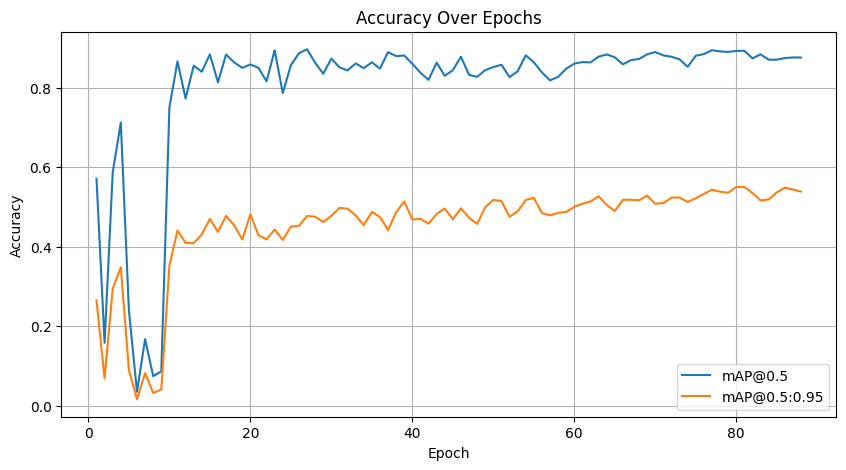

In [ ]:
log_dir = max(glob('runs/detect/train*'), key=the_number_in_the_string)

results = pd.read_csv(os.path.join(log_dir, 'results.csv'))
results.columns = results.columns.str.strip()

epochs = results.index + 1
mAP_0_5 = results['metrics/mAP50(B)']
mAP_0_5_0_95 = results['metrics/mAP50-95(B)']

plt.figure(figsize=(10, 5))
plt.plot(epochs, mAP_0_5, label='mAP@0.5')
plt.plot(epochs, mAP_0_5_0_95, label='mAP@0.5:0.95')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Accuracy Over Epochs')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
metrics=model.val(split='val')

Ultralytics 8.3.75 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 168 layers, 11,125,971 parameters, 0 gradients, 28.4 GFLOPs


val: Scanning /content/datasets/cars_license_plate/val/labels.cache... 44 images, 0 backgrounds, 0 corrupt: 100%|██████████| 44/44 [00:00<?, ?it/s]


WARNING ⚠️ cache='ram' may produce non-deterministic training results. Consider cache='disk' as a deterministic alternative if your disk space allows.


val: Caching images (0.0GB RAM): 100%|██████████| 44/44 [00:00<00:00, 83.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.24it/s]


                   all         44         44      0.844      0.858      0.893       0.55
Speed: 0.8ms preprocess, 7.2ms inference, 0.0ms loss, 1.2ms postprocess per image
Results saved to runs/detect/train2


In [ ]:

print(f"Mean Average Precision @.5:.95 : {metrics.box.map}")
print(f"Mean Average Precision @ .50   : {metrics.box.map50}")
print(f"Mean Average Precision @ .70   : {metrics.box.map75}")

Mean Average Precision @.5:.95 : 0.5501480922259052
Mean Average Precision @ .50   : 0.8925461726600816
Mean Average Precision @ .70   : 0.5878639290688368


Prediction of Some Sample Test Images


image 1/1 /content/datasets/cars_license_plate/test/images/Cars98.png: 320x320 1 license_plate, 53.5ms
Speed: 2.2ms preprocess, 53.5ms inference, 12.6ms postprocess per image at shape (1, 3, 320, 320)


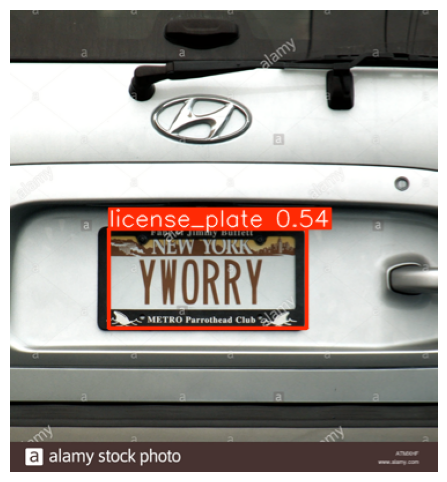


image 1/1 /content/datasets/cars_license_plate/test/images/Cars174.png: 192x320 (no detections), 99.2ms
Speed: 1.2ms preprocess, 99.2ms inference, 0.9ms postprocess per image at shape (1, 3, 192, 320)


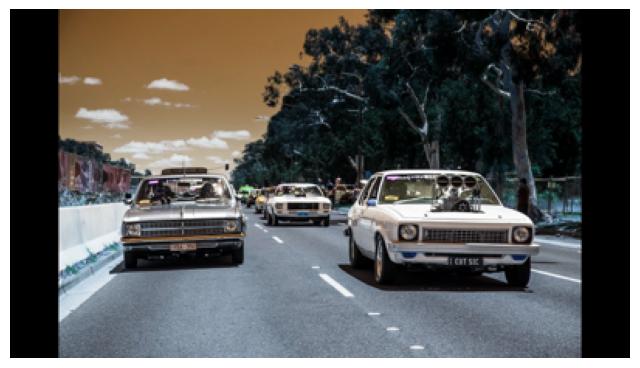


image 1/1 /content/datasets/cars_license_plate/test/images/Cars66.png: 256x320 1 license_plate, 60.4ms
Speed: 2.7ms preprocess, 60.4ms inference, 1.3ms postprocess per image at shape (1, 3, 256, 320)


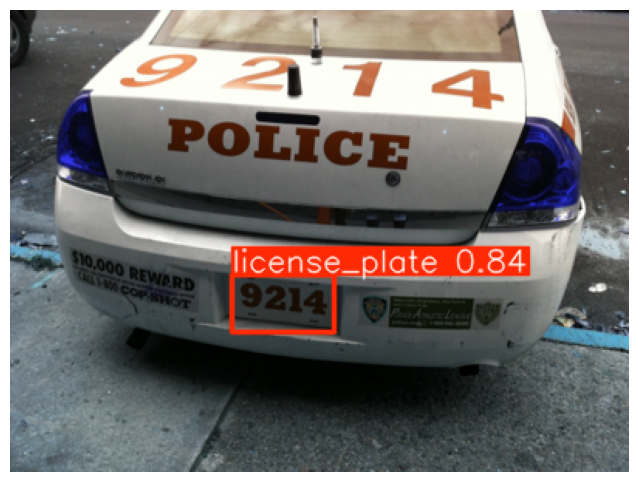


image 1/1 /content/datasets/cars_license_plate/test/images/Cars154.png: 320x256 1 license_plate, 58.6ms
Speed: 1.5ms preprocess, 58.6ms inference, 1.8ms postprocess per image at shape (1, 3, 320, 256)


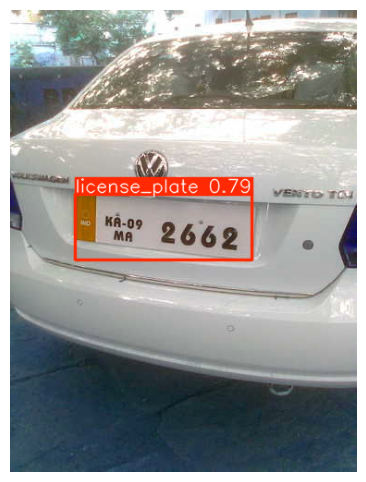


image 1/1 /content/datasets/cars_license_plate/test/images/Cars417.png: 256x320 1 license_plate, 11.1ms
Speed: 1.3ms preprocess, 11.1ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 320)


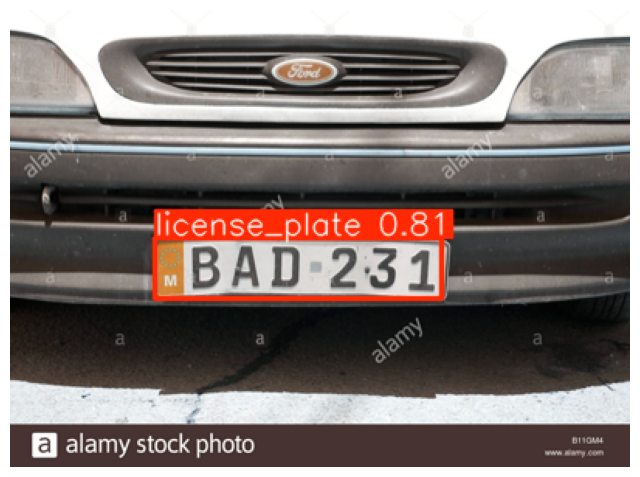


image 1/1 /content/datasets/cars_license_plate/test/images/Cars333.png: 224x320 1 license_plate, 71.5ms
Speed: 1.5ms preprocess, 71.5ms inference, 4.6ms postprocess per image at shape (1, 3, 224, 320)


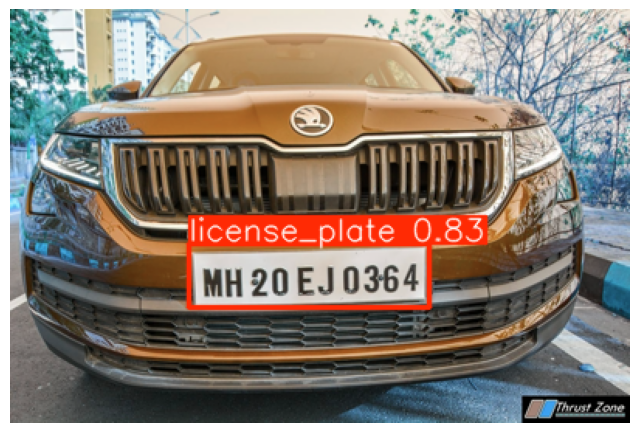


image 1/1 /content/datasets/cars_license_plate/test/images/Cars432.png: 224x320 1 license_plate, 9.2ms
Speed: 1.6ms preprocess, 9.2ms inference, 1.5ms postprocess per image at shape (1, 3, 224, 320)


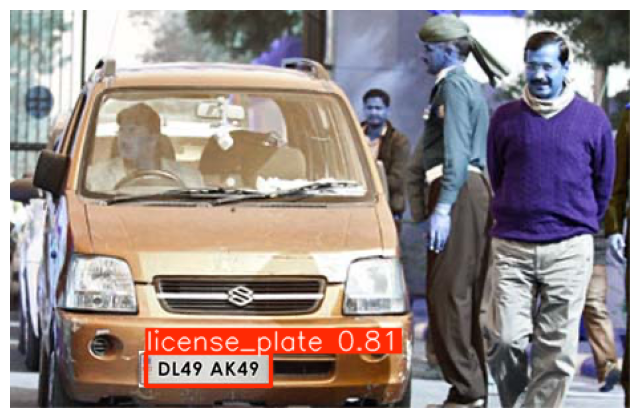


image 1/1 /content/datasets/cars_license_plate/test/images/Cars335.png: 320x320 2 license_plates, 13.5ms
Speed: 1.6ms preprocess, 13.5ms inference, 1.6ms postprocess per image at shape (1, 3, 320, 320)


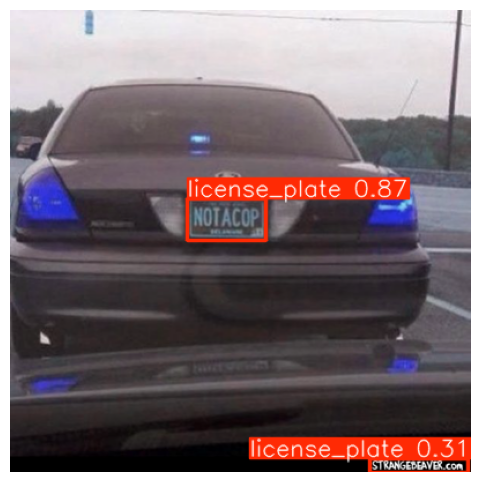


image 1/1 /content/datasets/cars_license_plate/test/images/Cars202.png: 256x320 1 license_plate, 13.1ms
Speed: 1.3ms preprocess, 13.1ms inference, 1.9ms postprocess per image at shape (1, 3, 256, 320)


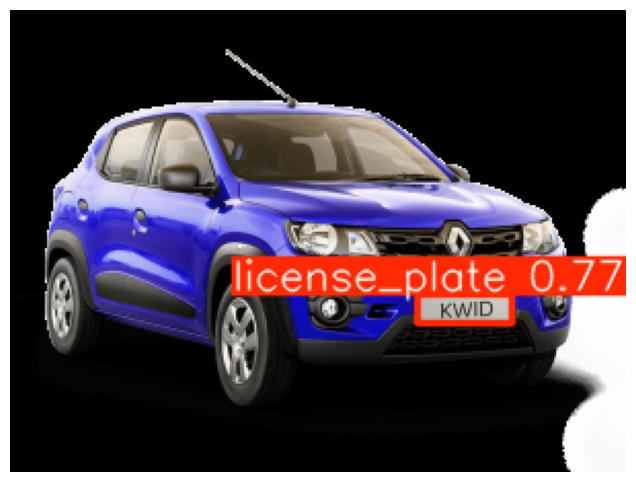


image 1/1 /content/datasets/cars_license_plate/test/images/Cars427.png: 256x320 1 license_plate, 8.4ms
Speed: 1.5ms preprocess, 8.4ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 320)


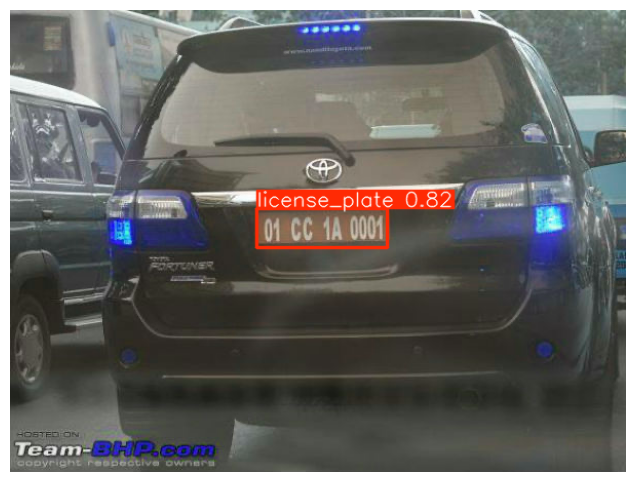


image 1/1 /content/datasets/cars_license_plate/test/images/Cars37.png: 224x320 1 license_plate, 9.3ms
Speed: 1.2ms preprocess, 9.3ms inference, 1.5ms postprocess per image at shape (1, 3, 224, 320)


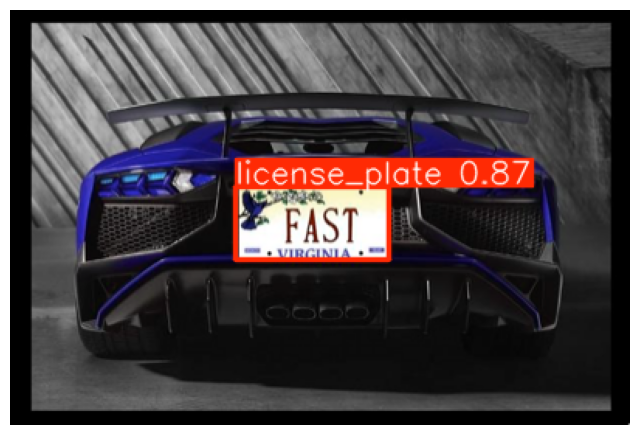


image 1/1 /content/datasets/cars_license_plate/test/images/Cars6.png: 256x320 1 license_plate, 11.5ms
Speed: 1.4ms preprocess, 11.5ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 320)


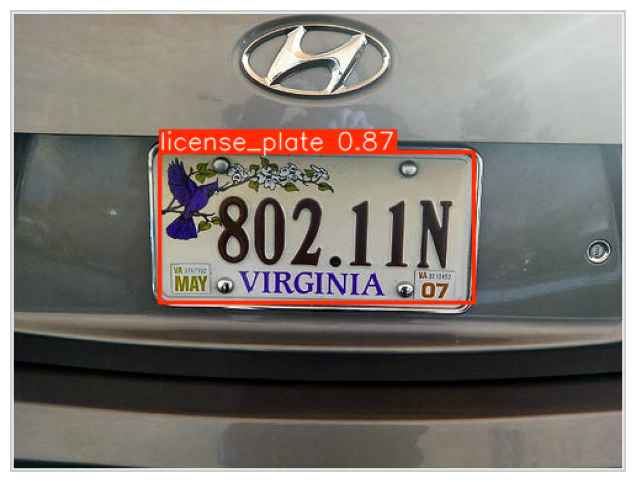


image 1/1 /content/datasets/cars_license_plate/test/images/Cars65.png: 288x320 1 license_plate, 59.8ms
Speed: 1.6ms preprocess, 59.8ms inference, 1.5ms postprocess per image at shape (1, 3, 288, 320)


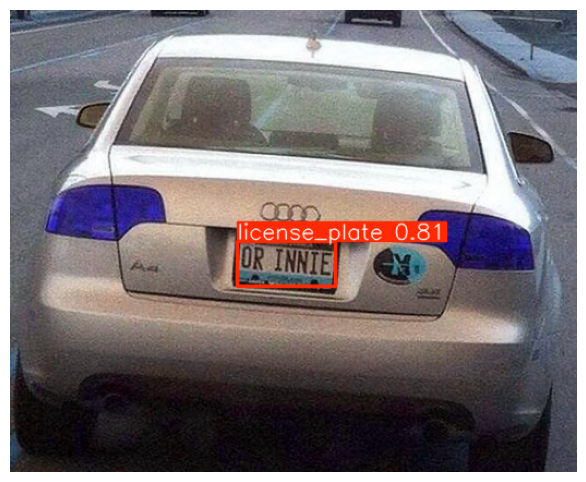


image 1/1 /content/datasets/cars_license_plate/test/images/Cars197.png: 192x320 1 license_plate, 10.4ms
Speed: 1.5ms preprocess, 10.4ms inference, 1.6ms postprocess per image at shape (1, 3, 192, 320)


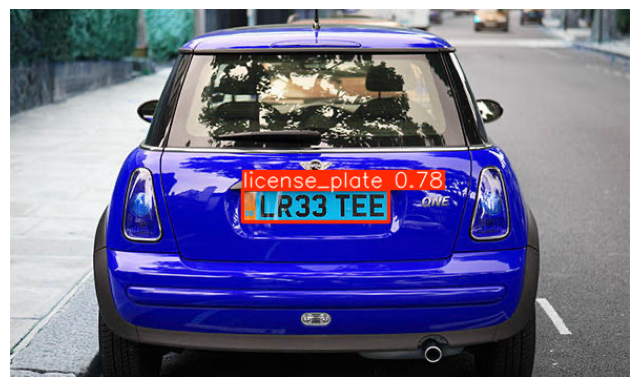


image 1/1 /content/datasets/cars_license_plate/test/images/Cars90.png: 256x320 1 license_plate, 10.1ms
Speed: 1.4ms preprocess, 10.1ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 320)


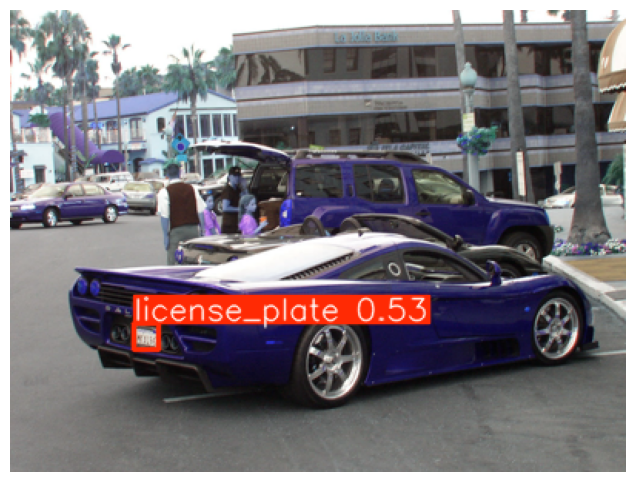


image 1/1 /content/datasets/cars_license_plate/test/images/Cars150.png: 256x320 1 license_plate, 9.4ms
Speed: 1.4ms preprocess, 9.4ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 320)


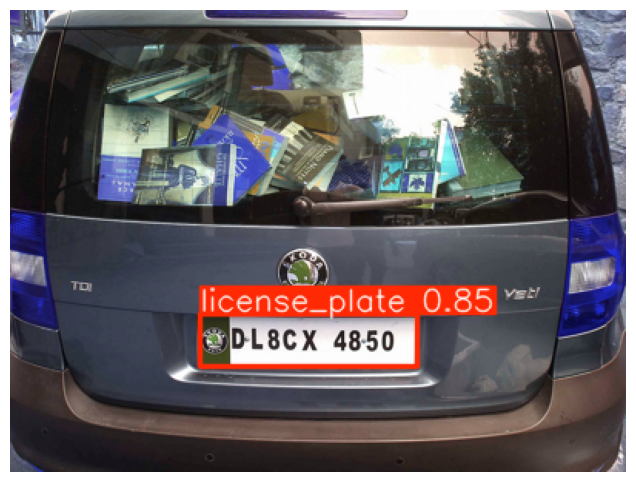


image 1/1 /content/datasets/cars_license_plate/test/images/Cars416.png: 256x320 1 license_plate, 9.5ms
Speed: 1.4ms preprocess, 9.5ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 320)


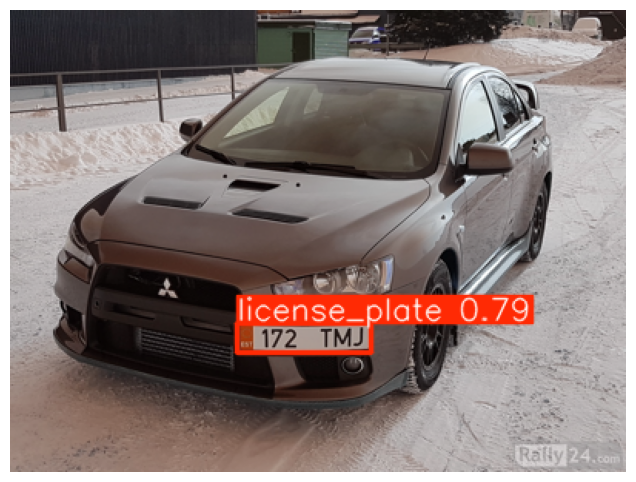


image 1/1 /content/datasets/cars_license_plate/test/images/Cars351.png: 192x320 1 license_plate, 10.7ms
Speed: 2.0ms preprocess, 10.7ms inference, 1.6ms postprocess per image at shape (1, 3, 192, 320)


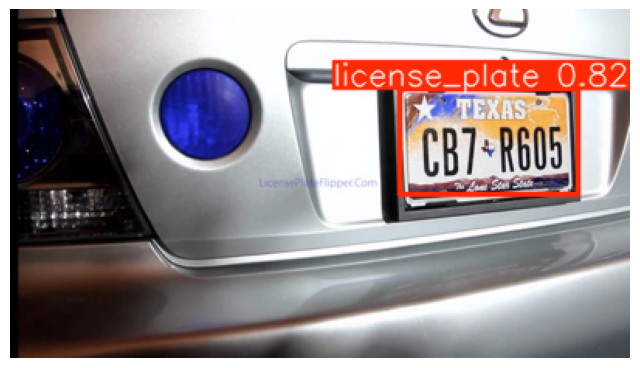


image 1/1 /content/datasets/cars_license_plate/test/images/Cars235.png: 192x320 1 license_plate, 9.4ms
Speed: 1.3ms preprocess, 9.4ms inference, 1.7ms postprocess per image at shape (1, 3, 192, 320)


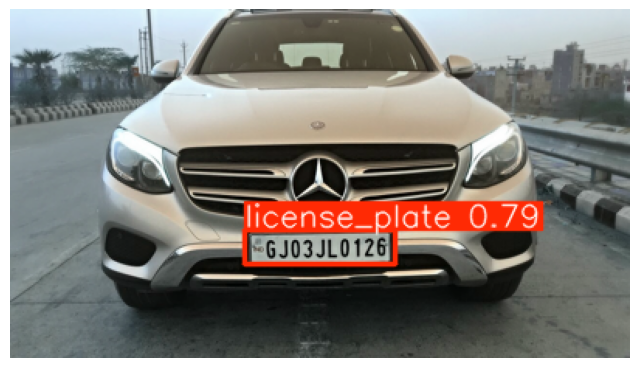


image 1/1 /content/datasets/cars_license_plate/test/images/Cars283.png: 192x320 2 license_plates, 16.8ms
Speed: 1.3ms preprocess, 16.8ms inference, 2.1ms postprocess per image at shape (1, 3, 192, 320)


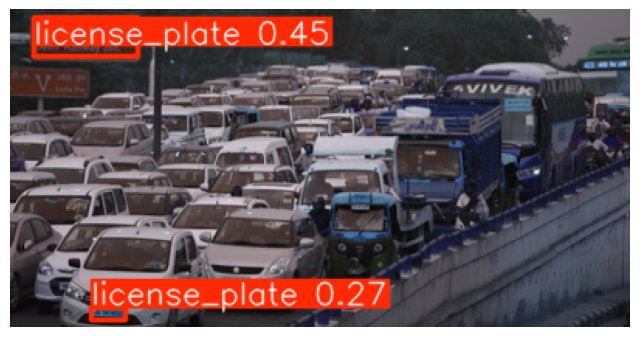


image 1/1 /content/datasets/cars_license_plate/test/images/Cars341.png: 224x320 1 license_plate, 12.3ms
Speed: 1.3ms preprocess, 12.3ms inference, 1.5ms postprocess per image at shape (1, 3, 224, 320)


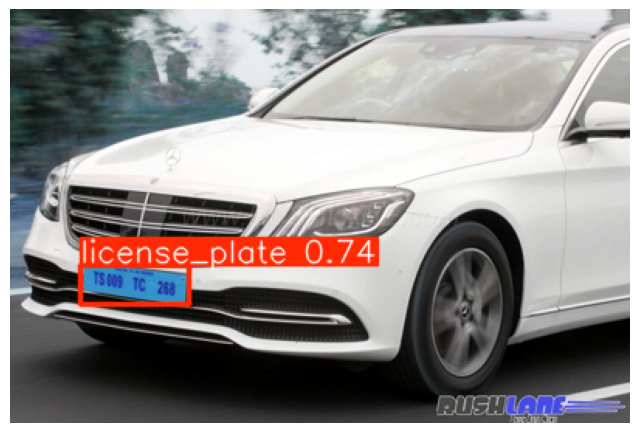


image 1/1 /content/datasets/cars_license_plate/test/images/Cars166.png: 320x256 2 license_plates, 9.6ms
Speed: 6.5ms preprocess, 9.6ms inference, 1.5ms postprocess per image at shape (1, 3, 320, 256)


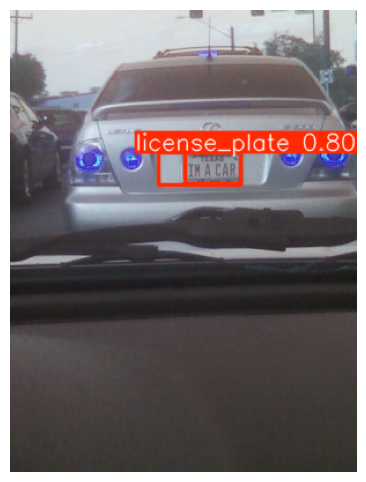


image 1/1 /content/datasets/cars_license_plate/test/images/Cars243.png: 256x320 1 license_plate, 9.8ms
Speed: 1.6ms preprocess, 9.8ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 320)


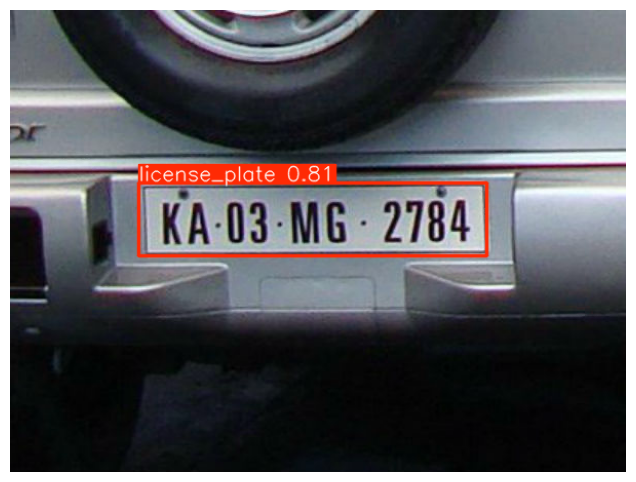


image 1/1 /content/datasets/cars_license_plate/test/images/Cars294.png: 224x320 1 license_plate, 11.8ms
Speed: 3.4ms preprocess, 11.8ms inference, 1.5ms postprocess per image at shape (1, 3, 224, 320)


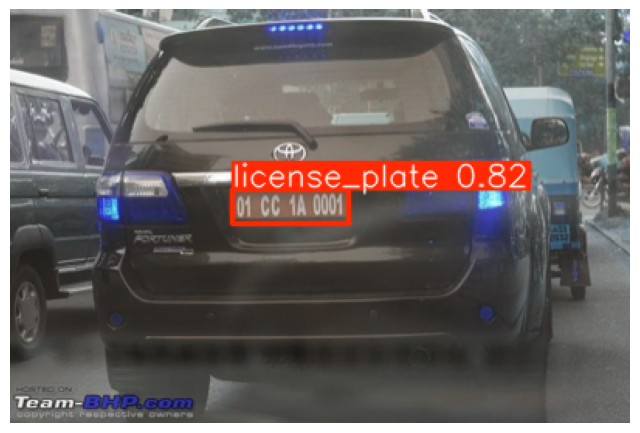


image 1/1 /content/datasets/cars_license_plate/test/images/Cars273.png: 192x320 1 license_plate, 9.3ms
Speed: 1.5ms preprocess, 9.3ms inference, 1.5ms postprocess per image at shape (1, 3, 192, 320)


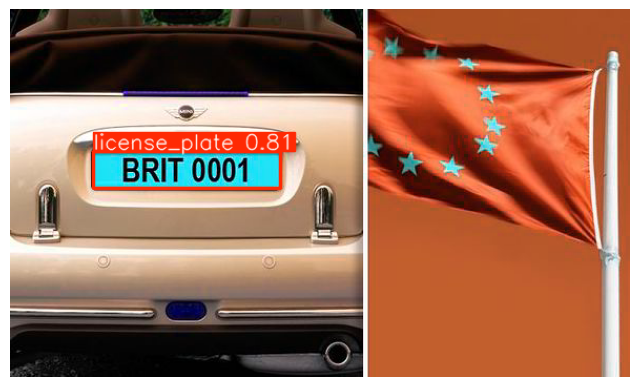


image 1/1 /content/datasets/cars_license_plate/test/images/Cars310.png: 288x320 1 license_plate, 9.4ms
Speed: 1.7ms preprocess, 9.4ms inference, 1.5ms postprocess per image at shape (1, 3, 288, 320)


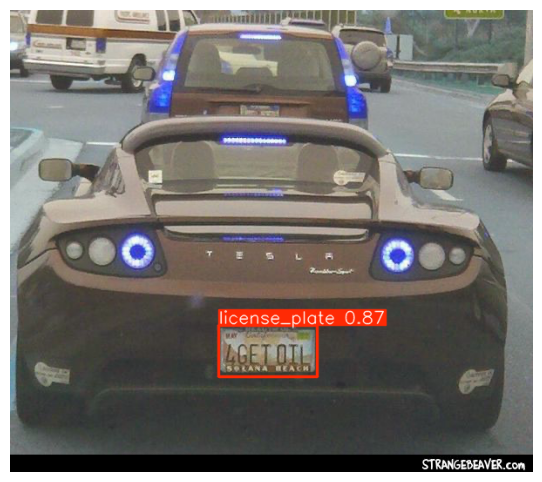


image 1/1 /content/datasets/cars_license_plate/test/images/Cars314.png: 192x320 1 license_plate, 12.1ms
Speed: 3.8ms preprocess, 12.1ms inference, 1.6ms postprocess per image at shape (1, 3, 192, 320)


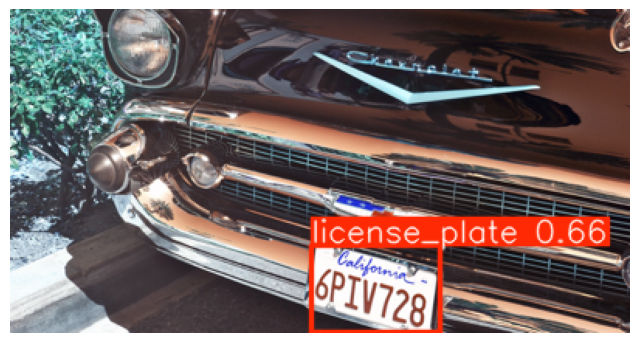


image 1/1 /content/datasets/cars_license_plate/test/images/Cars73.png: 192x320 1 license_plate, 11.8ms
Speed: 4.6ms preprocess, 11.8ms inference, 1.5ms postprocess per image at shape (1, 3, 192, 320)


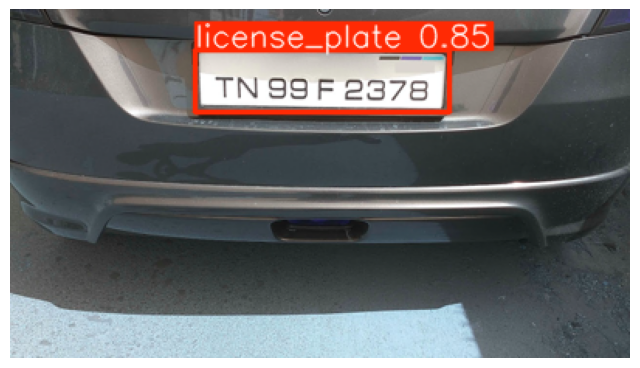


image 1/1 /content/datasets/cars_license_plate/test/images/Cars200.png: 224x320 1 license_plate, 11.2ms
Speed: 1.4ms preprocess, 11.2ms inference, 1.5ms postprocess per image at shape (1, 3, 224, 320)


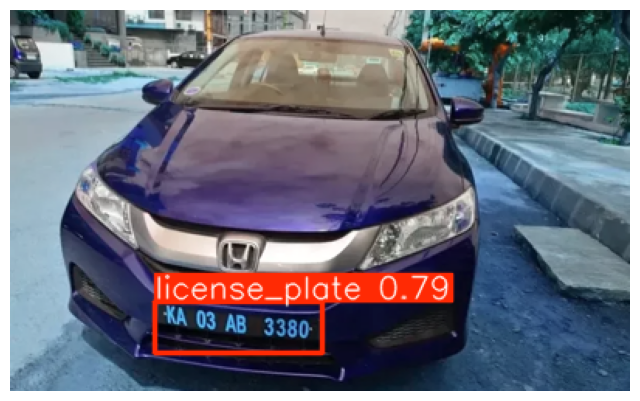


image 1/1 /content/datasets/cars_license_plate/test/images/Cars33.png: 192x320 1 license_plate, 14.1ms
Speed: 1.2ms preprocess, 14.1ms inference, 3.8ms postprocess per image at shape (1, 3, 192, 320)


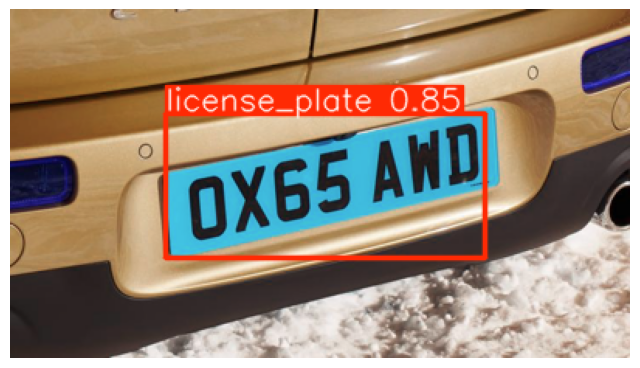


image 1/1 /content/datasets/cars_license_plate/test/images/Cars11.png: 256x320 1 license_plate, 10.3ms
Speed: 1.5ms preprocess, 10.3ms inference, 2.5ms postprocess per image at shape (1, 3, 256, 320)


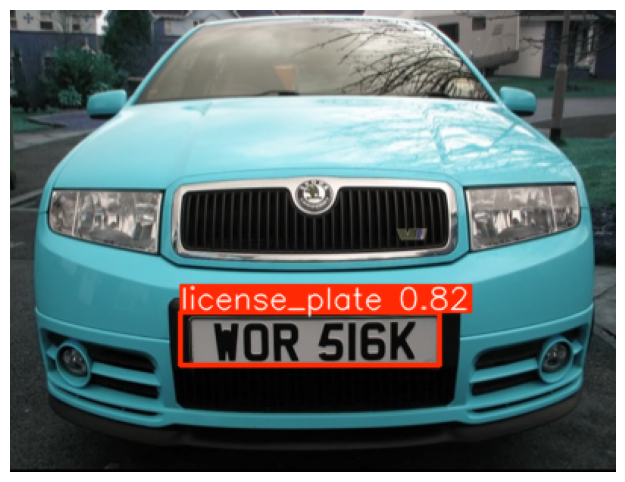


image 1/1 /content/datasets/cars_license_plate/test/images/Cars188.png: 320x256 (no detections), 15.2ms
Speed: 1.5ms preprocess, 15.2ms inference, 0.6ms postprocess per image at shape (1, 3, 320, 256)


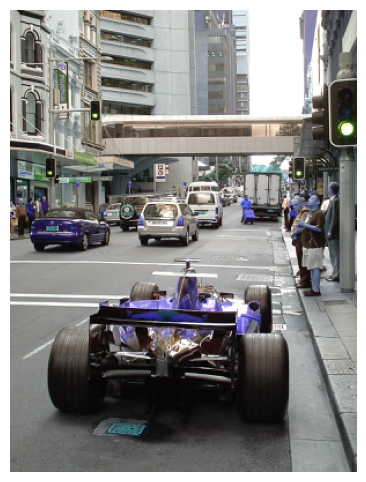


image 1/1 /content/datasets/cars_license_plate/test/images/Cars381.png: 192x320 1 license_plate, 9.3ms
Speed: 1.2ms preprocess, 9.3ms inference, 1.5ms postprocess per image at shape (1, 3, 192, 320)


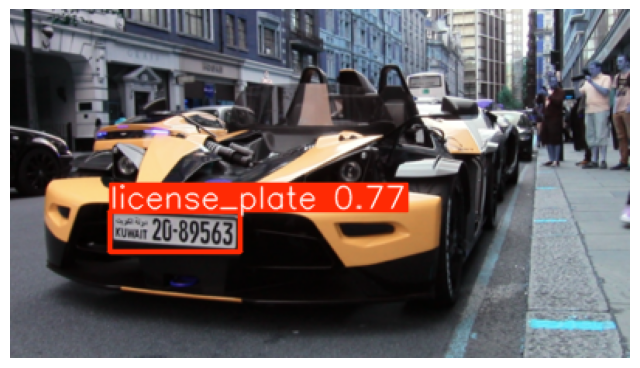


image 1/1 /content/datasets/cars_license_plate/test/images/Cars253.png: 192x320 1 license_plate, 11.6ms
Speed: 1.1ms preprocess, 11.6ms inference, 1.6ms postprocess per image at shape (1, 3, 192, 320)


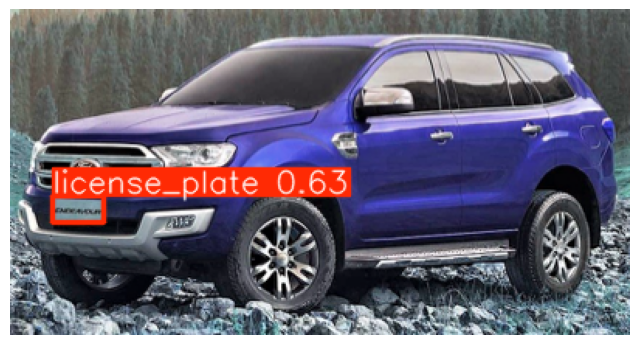


image 1/1 /content/datasets/cars_license_plate/test/images/Cars296.png: 256x320 1 license_plate, 10.6ms
Speed: 1.5ms preprocess, 10.6ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 320)


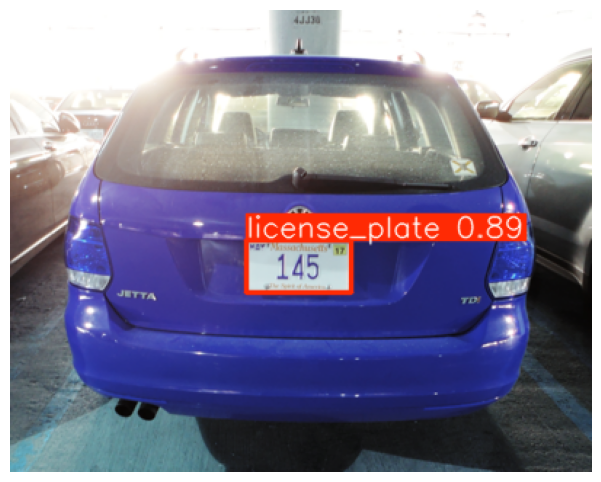


image 1/1 /content/datasets/cars_license_plate/test/images/Cars311.png: 224x320 1 license_plate, 16.4ms
Speed: 1.3ms preprocess, 16.4ms inference, 1.6ms postprocess per image at shape (1, 3, 224, 320)


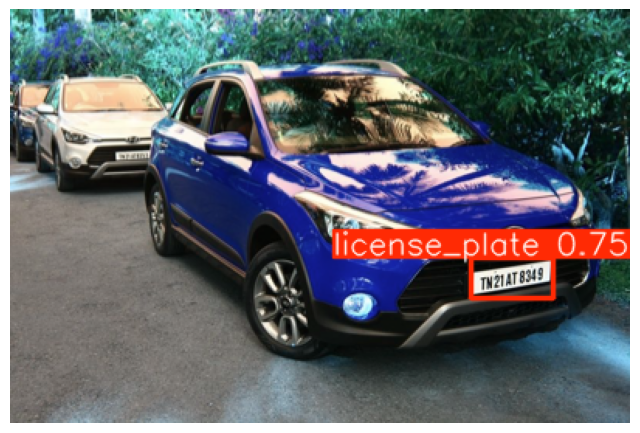


image 1/1 /content/datasets/cars_license_plate/test/images/Cars208.png: 224x320 1 license_plate, 9.6ms
Speed: 1.3ms preprocess, 9.6ms inference, 1.6ms postprocess per image at shape (1, 3, 224, 320)


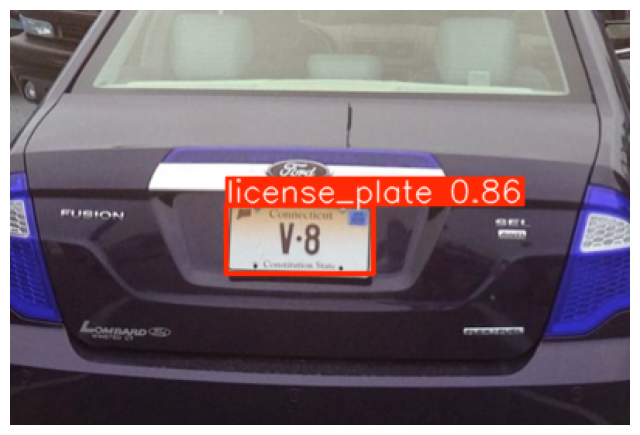


image 1/1 /content/datasets/cars_license_plate/test/images/Cars126.png: 256x320 1 license_plate, 9.8ms
Speed: 1.3ms preprocess, 9.8ms inference, 1.5ms postprocess per image at shape (1, 3, 256, 320)


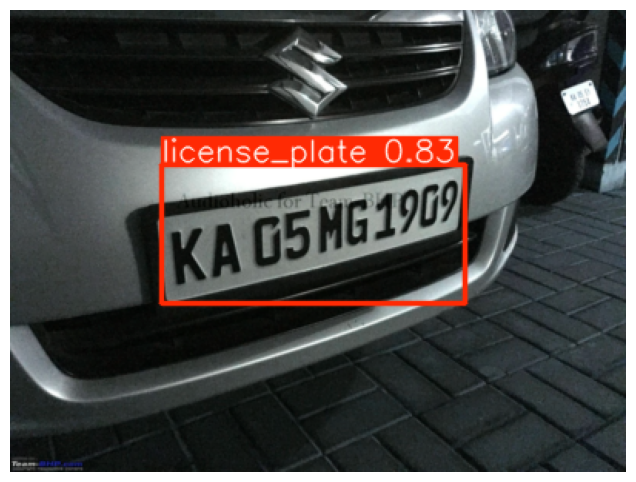


image 1/1 /content/datasets/cars_license_plate/test/images/Cars152.png: 224x320 1 license_plate, 10.5ms
Speed: 1.3ms preprocess, 10.5ms inference, 1.6ms postprocess per image at shape (1, 3, 224, 320)


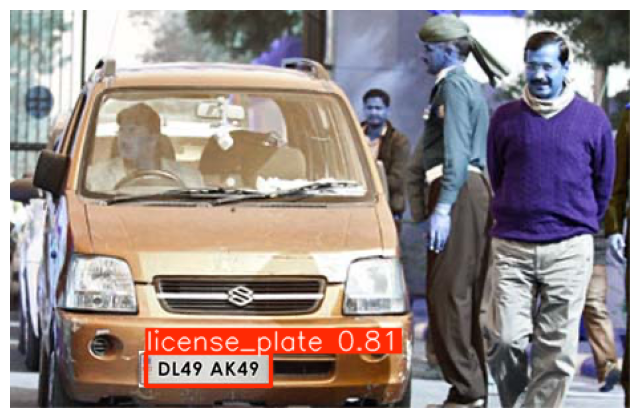


image 1/1 /content/datasets/cars_license_plate/test/images/Cars423.png: 224x320 1 license_plate, 10.5ms
Speed: 3.9ms preprocess, 10.5ms inference, 1.9ms postprocess per image at shape (1, 3, 224, 320)


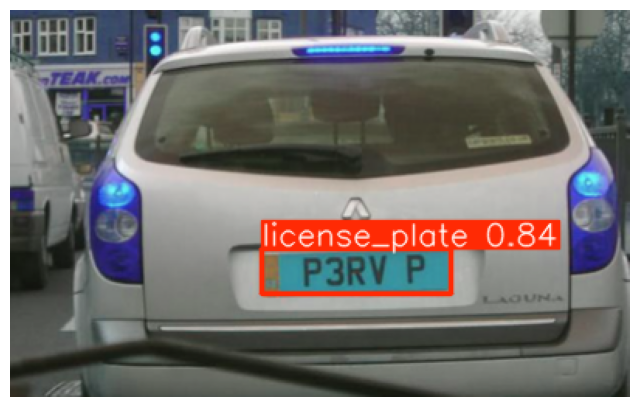

In [ ]:

image_dir = "/content/datasets/cars_license_plate/test/images"

all_images = os.listdir(image_dir)
selected_images = all_images[:40]

for img_name in selected_images:
    img_path = os.path.join(image_dir, img_name)
    results = model.predict(img_path)
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    for result in results:
        plotted_img = result.plot()
        plt.figure(figsize=(8, 6))
        plt.imshow(plotted_img)
        plt.axis('off')
        plt.show()